In [219]:
import numpy as np
import scipy as sp
import pandas as pd
import xarray as xr
import pymc as pm
import aesara.tensor as at
import arviz as az
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objs as go

rng = np.random.default_rng(32)

In [2]:
steps = pd.DataFrame((np.random.rand(1000, 16) * 2 - 1))
steps_tot = steps.cumsum(axis=1)

In [3]:
ff.create_distplot(
    [steps_tot[15]],
    ["Density - final steps"]
)

In [4]:
px.line(steps_tot.T)

/root/.cache/pypoetry/virtualenvs/dev-sZr6PvLR-py3.10/lib/python3.10/site-packages/plotly/express/_core.py:1222: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/root/.cache/pypoetry/virtualenvs/dev-sZr6PvLR-py3.10/lib/python3.10/site-packages/plotly/express/_core.py:1222: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/root/.cache/pypoetry/virtualenvs/dev-sZr6PvLR-py3.10/lib/python3.10/site-packages/plotly/express/_core.py:1222: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.inse

/root/.cache/pypoetry/virtualenvs/dev-sZr6PvLR-py3.10/lib/python3.10/site-packages/plotly/express/_core.py:1222: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/root/.cache/pypoetry/virtualenvs/dev-sZr6PvLR-py3.10/lib/python3.10/site-packages/plotly/express/_core.py:1222: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/root/.cache/pypoetry/virtualenvs/dev-sZr6PvLR-py3.10/lib/python3.10/site-packages/plotly/express/_core.py:1222: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.inse

### 4.2 & 4.3

10k products of 12 random numbers between 1 and 1.1

In [5]:
sizes = np.prod(sp.stats.uniform.rvs(loc=1, scale=1.1, size=(10_000, 12)), axis=1)
px.histogram(sizes)

### 4.4

In [6]:
big = pd.Series(
    np.prod(1 + sp.stats.uniform.rvs(0, 0.5, size=(10_000, 12)), axis=1),
    name="big_fluctuations"
)
small = pd.Series(
    np.prod(1 + sp.stats.uniform.rvs(0, 0.01, size=(10_000, 12)), axis=1),
    name="small_fluctuations"
)

df = pd.concat([big, small], axis=1)

In [7]:
px.histogram(df["big_fluctuations"])

In [8]:
px.histogram(df["small_fluctuations"])

### 4.5

Log-scale gaussianity for large deviates multiplied together

In [9]:
px.histogram(
    np.log(np.prod(1+sp.stats.uniform.rvs(0, 0.5, size=(10_000, 12)), axis=1))
)

### 4.6

In [10]:
w, n = 6, 9
p_grid = np.linspace(0, 1, 100)
posterior = (
    sp.stats.binom.pmf(p=p_grid, k=w, n=n)*
    sp.stats.uniform.pdf(p_grid, loc=0, scale=1)
)
posterior /= posterior.sum()
posterior = pd.Series(data=posterior, index=p_grid, name="posterior probability p")
px.line(posterior)

### 4.7 - 4.10

In [11]:
df = pd.read_csv("../Data/Howell1.csv", sep=";")
df

,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041914,41.0,1
4,145.415,41.276872,51.0,0
...,...,...,...,...
539,145.415,31.127751,17.0,1
540,162.560,52.163080,31.0,1
541,156.210,54.062497,21.0,0
542,71.120,8.051258,0.0,1


In [12]:
df.describe()

,height,weight,age,male
count,544.000000,544.000000,544.000000,544.000000
mean,138.263596,35.610618,29.344393,0.472426
std,27.602448,14.719178,20.746888,0.499699
min,53.975000,4.252425,0.000000,0.000000
25%,125.095000,22.007717,12.000000,0.000000
50%,148.590000,40.057844,27.000000,0.000000
75%,157.480000,47.209005,43.000000,1.000000
max,179.070000,62.992589,88.000000,1.000000


In [13]:
px.histogram(df, facet_col="male")

### 4.11

In [14]:
df2 = df[df["age"] >= 18]
px.histogram(df2, facet_col="male")

In [15]:
ff.create_distplot(
    [df2[df2["male"] == 0]["height"], df2[df2["male"] == 1]["height"]],
    ["female height", "male height"]
)

### 4.12 & 4.13

In [22]:
x_mu = np.linspace(100, 250, 100)
prior_mu = sp.stats.norm.pdf(x=x_mu, loc=178, scale=20)

x_sig = np.linspace(-10, 60, 100)
prior_sig = sp.stats.uniform.pdf(x_sig, loc=0, scale=50)

In [23]:
px.line(prior_sig)

In [24]:
px.line(prior_mu)

### 4.14 & 4.15

Prior predictive simulation (samples from joint prior)

In [27]:
sample_mu = sp.stats.norm.rvs(loc=178, scale=20, size=10_000)
sample_sig = sp.stats.uniform.rvs(loc=0, scale=50, size=10_000)
prior_h = sp.stats.norm.rvs(loc=sample_mu, scale=sample_sig)

px.histogram(prior_h, title="Prior samples, height")

### 4.16-4.18

In [137]:
# create grid and flatten+transpose to get flat mu, sigma pairs
post = np.mgrid[150:160.01:0.05, 7:9.01:0.01]
grid_shape = post.shape
post_flat = post.reshape(2, -1).T

# compute log-likelihood on mu, sigma grid for every data point
LL = sp.stats.norm.logpdf(
    x=df2["height"].values,
    loc=post_flat[:, 0, np.newaxis],
    scale=post_flat[:, 1, np.newaxis]
)
# sum log-likelihoods for all data points and reshape back into grid
LL_grid = LL.sum(axis=-1).T.reshape(
    *grid_shape[1:]
)

Visualise log-likelihood

In [200]:
df_ll = pd.DataFrame(
    LL_grid,
    index=post[0, :, 0],
    columns=post[1, 0]
)
px.imshow(
    df_ll.T,
    labels=dict(
        x="Log-likelihood mu",
        y="Log-likelihood sigma"
    )
)

In [239]:
prod = (
    # log-likelihood
    LL_grid + 
    # log mu prior
    sp.stats.norm.logpdf(x=post[0], loc=178, scale=20) + 
    # log sigma prior
    sp.stats.uniform.logpdf(x=post[1], loc=0, scale=50)
)
# why the max here?
posterior_prob = np.exp(prod - prod.max())
posterior_prob /= posterior_prob.sum()

# plot posterior
df_posterior = pd.DataFrame(
    posterior_prob,
    index=post[0, :, 0],
    columns=post[1, 0]
)
px.imshow(
    df_posterior.T,
    labels=dict(
        x="Posterior probability mu",
        y="Posterior Probability sigma"
    )
)

### 4.19 - 4.21

In [263]:
ds_posterior = xr.Dataset(
    coords=dict(mu=post[0, :, 0],sigma=post[1, 0]),
    data_vars={"posterior_prob":(("mu", "sigma"), posterior_prob)}    
)
df_post = ds_posterior.to_dataframe().reset_index()
samples = df_post.sample(n=10_000, replace=True, weights=df_post["posterior_prob"])

px.scatter(
    samples,
    x="mu",
    y="sigma",
    size="posterior_prob",
    title="Posterior samples",
    marginal_x="histogram",
    marginal_y="histogram"
)

### 4.22

In [270]:
print("89% CI mu: ", az.hdi(samples["mu"].values, hdi_prob=.89))
print("89% CI sig: ", az.hdi(samples["sigma"].values, hdi_prob=.89))

89% CI mu:  [153.9 155.2]
89% CI sig:  [7.28 8.19]


### 4.23 - 4.25

In [273]:
# smaller subsample
df3 = df2.sample(n=20)

# create grid and flatten+transpose to get flat mu, sigma pairs
post = np.mgrid[150:160.01:0.05, 7:9.01:0.01]
grid_shape = post.shape
post_flat = post.reshape(2, -1).T

# compute log-likelihood on mu, sigma grid for every data point
LL = sp.stats.norm.logpdf(
    x=df3["height"].values,
    loc=post_flat[:, 0, np.newaxis],
    scale=post_flat[:, 1, np.newaxis]
)
# sum log-likelihoods for all data points and reshape back into grid
LL_grid = LL.sum(axis=-1).T.reshape(
    *grid_shape[1:]
)

prod = (
    # log-likelihood
    LL_grid + 
    # log mu prior
    sp.stats.norm.logpdf(x=post[0], loc=178, scale=20) + 
    # log sigma prior
    sp.stats.uniform.logpdf(x=post[1], loc=0, scale=50)
)
# why the max here?
posterior_prob = np.exp(prod - prod.max())
posterior_prob /= posterior_prob.sum()

ds_posterior = xr.Dataset(
    coords=dict(mu=post[0, :, 0],sigma=post[1, 0]),
    data_vars={"posterior_prob":(("mu", "sigma"), posterior_prob)}    
)
df_post = ds_posterior.to_dataframe().reset_index()
samples = df_post.sample(n=10_000, replace=True, weights=df_post["posterior_prob"])

px.scatter(
    samples,
    x="mu",
    y="sigma",
    size="posterior_prob",
    title="Posterior samples",
    marginal_x="histogram",
    marginal_y="histogram"
)

### 4.26 - 4.30

In [275]:
with pm.Model() as model_4_1:
    mu = pm.Normal("mu", mu=178, sigma=20)
    sigma = pm.Uniform("sigma", lower=0, upper=50)
    h = pm.Normal("height", mu=mu, sigma=sigma, observed=df2.height.values)
    trace_4_1 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


array([[<AxesSubplot:title={'center':'mu'}>,
        <AxesSubplot:title={'center':'mu'}>],
       [<AxesSubplot:title={'center':'sigma'}>,
        <AxesSubplot:title={'center':'sigma'}>]], dtype=object)

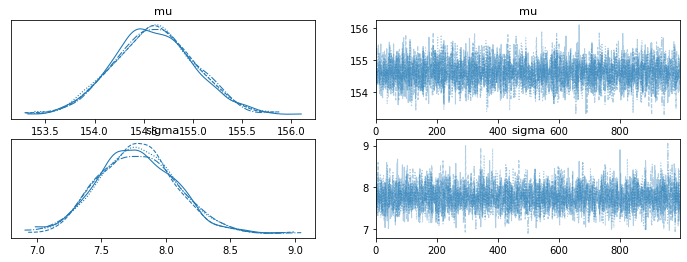

In [277]:
az.plot_trace(trace_4_1)

In [283]:
az.summary(trace_4_1, round_to=2, kind="stats")

,mean,sd,hdi_3%,hdi_97%
mu,154.61,0.41,153.85,155.37
sigma,7.78,0.29,7.25,8.33


In [284]:
trace_4_1.posterior.to_dataframe().describe().T

,count,mean,std,min,25%,50%,75%,max
mu,4000.0,154.605306,0.408075,153.285544,154.328035,154.601520,154.879779,156.102684
sigma,4000.0,7.777288,0.294374,6.903786,7.570672,7.770799,7.973179,9.050132


### 4.31

In [286]:
with pm.Model() as model_4_2:
    mu = pm.Normal("mu", mu=178, sigma=0.1)
    sigma = pm.Uniform("sigma", lower=0, upper=50)
    height = pm.Normal("height", mu=mu, sigma=sigma, observed=df2.height.values)
    trace_4_2 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


In [289]:
az.summary(trace_4_2, kind="stats")

,mean,sd,hdi_3%,hdi_97%
mu,177.866,0.101,177.669,178.047
sigma,24.621,0.958,22.899,26.408


### 4.32

In [294]:
df_trace_4_1 = az.extract_dataset(trace_4_1).to_dataframe()
df_trace_4_1.cov()

,mu,sigma
mu,0.166525,-0.000404
sigma,-0.000404,0.086656


### 4.33

In [298]:
df_trace_4_1.corr()

,mu,sigma
mu,1.000000,-0.003359
sigma,-0.003359,1.000000
